In [1]:
# Utilities
import re
import pickle
import numpy as np
import pandas as pd
import torch
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
from nltk.tokenize import word_tokenize
import pickle as pk
import os
import json
import pandas as pd
import csv
import torch
import torch.nn as nn
from dgl.nn import GraphConv
from keras.preprocessing.text import one_hot
# Plot libraries
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [2]:
def structure(dictionary):

    new_dict = {}#υπάρχει επόμενο υπολεξικό;
    for key,value in dictionary.items() :
        if value != []:
            new_dict = value
            pos = len(new_dict)
            for i in range(pos):
                keys.append(key)
            for z,y in new_dict.items():
                values.append(z)  
            structure(new_dict)

    return keys, values

In [3]:
def edges(file):
    with open(file) as user_file:
        file_contents = user_file.read()
        dict0 = json.loads(file_contents)
        tweets = []
        reply = []
        source, target = structure(dict0)
        source=source+tweets
        target=target+reply     
        
    return source, target


In [4]:
# #read all edges from structure files  --- TRAINING DATA
keys = []
values = []

tuple1 = []    
lista = os.listdir('dataset')

for i in lista:
    with open('dataset/'+i+'/structure.json', 'r', encoding='utf-8') as file:
        tuple1= edges(file.name)
    file.close()
source=tuple1[0]
target=tuple1[1]

df = pd.DataFrame(list(zip(source, target)),columns=['source','target'])

In [5]:
df

,source,target
0,498280126254428160,498280920227794945
1,498280126254428160,498282494387843072
2,498280126254428160,498283789744103424
3,498280126254428160,498323335965868032
4,498430783699554305,498432131669192704
...,...,...
4248,577258317942149120,577260238316830721
4249,577258317942149120,577282462788677634
4250,577258317942149120,577283431089901568
4251,577258317942149120,577284294051123201


In [6]:
### EDGES EXTRACTION FROM THE LIST ABOVE

sourcelist=[]
targetlist=[]
output=[]
for i in range(1, len(source)+1):
    sourcelist.append(source[i-1])
    targetlist.append(target[i-1])
    if (i ==len(source)) or not ((source[i-1]==source[i]) or (source[i] in targetlist)):
        output.append({
            'source_list': sourcelist,
            'target_list': targetlist
        })
        sourcelist=[]
        targetlist=[]

In [7]:
len(output)

272

In [8]:
# #read all edges from structure files  --- VALIDATION DATA
keys = []
values = []

tuple1 = []    
lista = os.listdir('dataset_val')

for i in lista:
    with open('dataset_val/'+i+'/structure.json', 'r', encoding='utf-8') as file:
        tuple1= edges(file.name)
    file.close()
source=tuple1[0]
target=tuple1[1]

dfv = pd.DataFrame(list(zip(source, target)),columns=['source','target'])

In [9]:
dfv

,source,target
0,580319078155468800,580319546592112640
1,580319078155468800,580319622521442304
2,580319078155468800,580319644013170688
3,580319078155468800,580319644218687488
4,580319078155468800,580319878328020992
...,...,...
271,581473088249958400,581473907275915264
272,581473088249958400,581474582302949376
273,581473088249958400,581478014531203072
274,581473088249958400,581482916645076993


In [10]:
### EDGES EXTRACTION FROM THE LIST ABOVE

sourcelistv=[]
targetlistv=[]
outputv=[]
for i in range(1, len(source)+1):
    sourcelistv.append(source[i-1])
    targetlistv.append(target[i-1])
    if (i ==len(source)) or not ((source[i-1]==source[i]) or (source[i] in targetlistv)):
        outputv.append({
            'source_list': sourcelistv,
            'target_list': targetlistv
        })
        sourcelistv=[]
        targetlistv=[]

In [11]:
len(outputv)

25

In [12]:
### List of the initial tweets  TRAIN DATA
lista = os.listdir('dataset')
source_texts = []
replies_id = []
replies_text = []
for i in lista:
    with open('dataset/'+i+'/source-tweet/'+i+'.json') as sourcefile:
        source_content = sourcefile.read()
        source_dict = json.loads(source_content)
        source_text = source_dict["text"]
        source_texts.append(source_text)
        for k in os.listdir('dataset/'+i+'/replies'):
            #replies_id.append(k)
            replies_id.append(k[:-5])         
            with open('dataset/'+i+'/replies/'+k) as textofreply:             
                reply_content = textofreply.read()
                reply_dict = json.loads(reply_content)
                reply_text = reply_dict['text']
                replies_text.append(reply_text)
dft = pd.DataFrame(list(zip(lista, source_texts)),
              columns=['tweet0','text'])
print(dft)

with open('stances.json') as f:
    content = f.read()
    cont_dict = json.loads(content)

    
stance2 = []
for i in lista:  ##list of initial tweets
    for k,v in cont_dict.items():
        if i in k:
            stance2.append(v)
stance = []            
for z in replies_id:   ###list of replies
    for k,v in cont_dict.items():
        if z in k:
            stance.append(v)            
            
### merge initial tweets and replies            
id=replies_id+lista
tweet = replies_text+source_texts
stance_status=stance+stance2

tweet_id=[]
for element in id:
    tweet_id.append(int(element))
            
### 0 SUPPORT, 1 COMMENT, 2 QUERY, 3 DENY

for i in range(len(stance_status)):
    if stance_status[i] == 'support':
        stance_status[i] = 0
    if stance_status[i] == 'comment':
        stance_status[i] = 1
    if stance_status[i] == 'query':
        stance_status[i] = 2
    if stance_status[i] == 'deny':
        stance_status[i] = 3
        
dft3 = pd.DataFrame(list(zip(tweet_id, tweet, stance_status)),columns=['id','tweet','stance'])


                 tweet0                                               text
0    498280126254428160  Mike Brown was staying with his grandmother fo...
1    498430783699554305  Witness: Police allegedly stopped Mike Brown a...
2    499366666300846081  Line of police cars with high beams on greets ...
3    499368931367608320  Currently the #FoxNews website has zero, repea...
4    499456140044824576  St. Louis Co Police tell me ofcr shot a man wh...
..                  ...                                                ...
267  576755174531862529  Coup? RT @jimgeraghty: Rumors all Russian mili...
268  576796432730071040  Unformed Russian Embassy staff in London have ...
269  576812998418939904  Putin reappears on television amid rumours his...
270  576829262927413248  Very good on #Putin coup by @CoalsonR: Three S...
271  577258317942149120  Was Vladimir Putin netralized by an internal c...

[272 rows x 2 columns]


In [13]:
output1 = output

In [14]:
### List of the initial tweets  VALIDATION DATA
lista = os.listdir('dataset_val')
source_texts = []
replies_id = []
replies_text = []
for i in lista:
    with open('dataset_val/'+i+'/source-tweet/'+i+'.json') as sourcefile:
        source_content = sourcefile.read()
        source_dict = json.loads(source_content)
        source_text = source_dict["text"]
        source_texts.append(source_text)
        for k in os.listdir('dataset_val/'+i+'/replies'):
            #replies_id.append(k)
            replies_id.append(k[:-5])         
            with open('dataset_val/'+i+'/replies/'+k) as textofreply:             
                reply_content = textofreply.read()
                reply_dict = json.loads(reply_content)
                reply_text = reply_dict['text']
                replies_text.append(reply_text)
dft = pd.DataFrame(list(zip(lista, source_texts)),
              columns=['tweet0','text'])
print(dft)

with open('stances.json') as f:
    content = f.read()
    cont_dict = json.loads(content)

    
stance2 = []
for i in lista:  ##list of initial tweets
    for k,v in cont_dict.items():
        if i in k:
            stance2.append(v)
stance = []            
for z in replies_id:   ###list of replies
    for k,v in cont_dict.items():
        if z in k:
            stance.append(v)            
            
### merge initial tweets and replies            
id=replies_id+lista
tweet = replies_text+source_texts
stance_status=stance+stance2

tweet_id=[]
for element in id:
    tweet_id.append(int(element))
            
### 0 SUPPORT, 1 COMMENT, 2 QUERY, 3 DENY

for i in range(len(stance_status)):
    if stance_status[i] == 'support':
        stance_status[i] = 0
    if stance_status[i] == 'comment':
        stance_status[i] = 1
    if stance_status[i] == 'query':
        stance_status[i] = 2
    if stance_status[i] == 'deny':
        stance_status[i] = 3
        
dft3v = pd.DataFrame(list(zip(tweet_id, tweet, stance_status)),columns=['id','tweet','stance'])


                tweet0                                               text
0   580319078155468800  Germanwings Airbus A320 crashes in French Alps...
1   580319184652890113  BREAKING: 148 passengers were on board #German...
2   580320684305416192  Accident aircraft looks to be Germanwings (Air...
3   580321156508577792  Now hearing 148 passengers + crew on board the...
4   580322453928431617  German Wings airline tweeting now about report...
5   580323060533764097  Germanwings passenger plane crashes in France:...
6   580324027715063808  JUST IN: Germanwings plane crashes in southern...
7   580325090367315968  Flight #4U9525 initially climbed to 38,000 fee...
8   580326222107951104  Heart goes out to 148 passengers and crew of G...
9   580331561398108160  1047 call: DGAC source says pilots called «urg...
10  580332109782466561  #4U9525 From FL380 to FL110 in 8 min? That's a...
11  580333763512705025  #Germanwings latest: http://t.co/8tZopIBYLh\n-...
12  580333909008871424  French junior 

In [15]:
### TEST DATASET ####
# #read all edges from structure files
keys = []
values = []

tuple1 = []    
lista = os.listdir('dataset_test')

for i in lista:
    with open('dataset_test/'+i+'/structure.json', 'r', encoding='utf-8') as file:
        tuple1= edges(file.name)
    file.close()
source=tuple1[0]
target=tuple1[1]

df = pd.DataFrame(list(zip(source, target)),columns=['source','target'])

In [16]:
### EDGES EXTRACTION FROM THE LIST ABOVE

sourcelist=[]
targetlist=[]
output=[]
for i in range(1, len(source)+1):
    sourcelist.append(source[i-1])
    targetlist.append(target[i-1])
    if (i ==len(source)) or not ((source[i-1]==source[i]) or (source[i] in targetlist)):
        output.append({
            'source_list': sourcelist,
            'target_list': targetlist
        })
        sourcelist=[]
        targetlist=[]

In [17]:
output2 = output

In [18]:
### List of the initial tweets
lista = os.listdir('dataset_test')
source_texts = []
replies_id = []
replies_text = []
for i in lista:
    with open('dataset_test/'+i+'/source-tweet/'+i+'.json') as sourcefile:
        source_content = sourcefile.read()
        source_dict = json.loads(source_content)
        source_text = source_dict["text"]
        source_texts.append(source_text)
        for k in os.listdir('dataset_test/'+i+'/replies'):
            #replies_id.append(k)
            replies_id.append(k[:-5])         
            with open('dataset_test/'+i+'/replies/'+k) as textofreply:             
                reply_content = textofreply.read()
                reply_dict = json.loads(reply_content)
                reply_text = reply_dict['text']
                replies_text.append(reply_text)
dft = pd.DataFrame(list(zip(lista, source_texts)),
              columns=['tweet0','text'])
print(dft)

with open('stancesq.json') as f:
    content = f.read()
    cont_dict = json.loads(content)

    
stance2 = []
for i in lista:  ##list of initial tweets
    for k,v in cont_dict.items():
        if i in k:
            stance2.append(v)
stance = []            
for z in replies_id:   ###list of replies
    for k,v in cont_dict.items():
        if z in k:
            stance.append(v)            
            
### merge initial tweets and replies            
id=replies_id+lista
tweet = replies_text+source_texts
stance_status=stance+stance2

tweet_id=[]
for element in id:
    tweet_id.append(int(element))
            
### 0 SUPPORT, 1 COMMENT, 2 QUERY, 3 DENY

for i in range(len(stance_status)):
    if stance_status[i] == 'support':
        stance_status[i] = 0
    if stance_status[i] == 'comment':
        stance_status[i] = 1
    if stance_status[i] == 'query':
        stance_status[i] = 2
    if stance_status[i] == 'deny':
        stance_status[i] = 3
        
dft3q = pd.DataFrame(list(zip(tweet_id, tweet, stance_status)),columns=['id','tweet','stance'])


                tweet0                                               text
0   498293668655423488  Every 28 hours a black male is killed in the U...
1   498486826269548545  .@AP I demand you retract the lie that people ...
2   500280249629036544  Police name the officer who shot #Ferguson tee...
3   500298588992593920  Police have named the cop who shot Michael Bro...
4   524923293711998976  At the war memorial in. Ottawa. A soldier has ...
5   524936793633083394  Very tense situation in Ottawa this morning.  ...
6   524941720249978880  Footage from Globe reporter captures exchange ...
7   524948206023880704  The latest @CBCNews on #Ottawa shootings. Gunm...
8   524961721744900097  Canadian soldier who was shot at #Ottawa's War...
9   544274544174071809  Take a break from bashing Cheney and waterboar...
10  544294893146091520  Ongoing hostage situation in Sydney café. #syd...
11  544315472075042818  US consulate in #Sydney reportedly evacuated a...
12  552788945017516032  Appalled by th

In [20]:
# dft3 train dataset
# dft3v val dataset
# dtf3q test dataset


In [21]:
# Defining regex patterns.
urlPattern        = r"((http://)[^ ]*|(https://)[^ ]*|(www\.)[^ ]*)"
userPattern       = '@[^\s]+'
hashtagPattern    = '#[^\s]+'
alphaPattern      = "[^a-z0-9<>?]"
sequencePattern   = r"(.)\1\1+"
seqReplacePattern = r"\1\1"

# Defining regex for emojis
smileemoji        = r"[8:=;]['`\-]?[)d]+"
sademoji          = r"[8:=;]['`\-]?\(+"
neutralemoji      = r"[8:=;]['`\-]?[\/|l*]"
lolemoji          = r"[8:=;]['`\-]?p+"

In [22]:
def preprocess_apply(tweet):

    tweet = tweet.lower()

    # Replace all URls with 'url'
    tweet = re.sub(urlPattern,'url',tweet)
    # Replace @USERNAME to 'user'.
    tweet = re.sub(userPattern,'user', tweet)
    
    # Replace all emojis.
    tweet = re.sub(r'<3', 'heart', tweet)
    tweet = re.sub(smileemoji, 'smile', tweet)
    tweet = re.sub(sademoji, 'sadface', tweet)
    tweet = re.sub(neutralemoji, 'neutralface', tweet)
    tweet = re.sub(lolemoji, 'lolface', tweet)

    return tweet

In [24]:
dft3

,id,tweet,stance
0,498280920227794945,@MichaelSkolnik -- wow,1
1,498282494387843072,@MichaelSkolnik Unbelieveable ..... We R in do...,1
2,498283789744103424,@MichaelSkolnik Emmett Till was visiting his f...,1
3,498323335965868032,“@MichaelSkolnik: Mike Brown was staying with ...,0
4,498432131669192704,@MichaelSkolnik cool! Darkskinned man is a cri...,1
...,...,...,...
4233,576755174531862529,Coup? RT @jimgeraghty: Rumors all Russian mili...,0
4234,576796432730071040,Unformed Russian Embassy staff in London have ...,0
4235,576812998418939904,Putin reappears on television amid rumours his...,0
4236,576829262927413248,Very good on #Putin coup by @CoalsonR: Three S...,0


In [25]:
dft3['tweet'] = dft3.tweet.apply(preprocess_apply)
dft3v['tweet'] = dft3v.tweet.apply(preprocess_apply)
dft3q['tweet'] = dft3q.tweet.apply(preprocess_apply)

In [27]:
dft3v['label_dev'] = 1   ## 1 for val data

In [28]:
dft3q['label_dev'] = 2   ## 2 for test data

In [29]:
## add in dataframe the label of nodes if they belong to train or dev group. Dev=1, Train=0
with open('dev.json') as devfile:
    contentdevfile = devfile.read()
    cont_dictdevfile = json.loads(contentdevfile)
listdev = []
for k,v in cont_dictdevfile.items():
    listdev.append(k)
list_dev=[int(x) for x in listdev]

col_list = dft3.id.values.tolist()
label_dev=[]
for i in col_list:
    if i in list_dev:
        label_dev.append(1)
    else:
        label_dev.append(0)

dft3['label_dev']=label_dev        

In [30]:
dft3v

,id,tweet,stance,label_dev
0,580319546592112640,<user> <user> <user> <user>,1,1
1,580319622521442304,“<user> germanwings airbus a320 crashes in fre...,1,1
2,580319644013170688,“<user> germanwings airbus a320 crashes in fre...,0,1
3,580319644218687488,“<user> germanwings airbus a320 crashes in fre...,3,1
4,580319878328020992,rt <user> germanwings airbus a320 crashes in f...,0,1
...,...,...,...,...
276,581047170637381632,names of pilots rumored to be patrick sonderhe...,0,1
277,581063377226637312,#4u9525: robin names andreas lubitz as the cop...,0,1
278,581293286268129280,german news: co-pilot of germanwings airbus wa...,0,1
279,581386094337474560,rt <user> german media reporting #andreaslubit...,0,1


In [31]:

dff = pd.concat([dft3, dft3v, dft3q], ignore_index=True)

In [32]:
### 0-4237  TRAIN
### 4238 - 4518 DEV
### 4519 - 5567 TEST


In [33]:
dft3 = dff

In [34]:
dft3['label_dev'].value_counts()

label_dev
0    4238
2    1049
1     281
Name: count, dtype: int64

In [35]:
dft3_train= dft3.loc[dft3['label_dev'] == 0]

In [36]:
dft3_test= dft3.loc[dft3['label_dev'] == 2]

In [37]:
dft3_val = dft3.loc[dft3['label_dev'] == 1]

In [38]:
dft3['Text_Tokenized'] = dft3['tweet'].str.lower().apply(word_tokenize)
dft3

,id,tweet,stance,label_dev,Text_Tokenized
0,498280920227794945,<user> -- wow,1,0,"[<, user, >, --, wow]"
1,498282494387843072,<user> unbelieveable ..... we r in double digi...,1,0,"[<, user, >, unbelieveable, ....., we, r, in, ..."
2,498283789744103424,<user> emmett till was visiting his family too...,1,0,"[<, user, >, emmett, till, was, visiting, his,..."
3,498323335965868032,“<user> mike brown was staying with his grandm...,0,0,"[“, <, user, >, mike, brown, was, staying, wit..."
4,498432131669192704,<user> cool! darkskinned man is a crime elemen...,1,0,"[<, user, >, cool, !, darkskinned, man, is, a,..."
...,...,...,...,...,...
5563,767725956706414592,"""go online &amp; put down 'hillary clinton ill...",3,2,"[``, go, online, &, amp, ;, put, down, 'hillar..."
5564,768859780240773121,sick hillary is seen here using great caution ...,0,2,"[sick, hillary, is, seen, here, using, great, ..."
5565,769988636754505729,267 days since sick hillary had a press confer...,0,2,"[267, days, since, sick, hillary, had, a, pres..."
5566,774991078265094144,"except for the coughing, fainting, apparent se...",0,2,"[except, for, the, coughing, ,, fainting, ,, a..."


In [39]:
##################### LSTM  #################################
#############################################################

In [40]:
import numpy
from keras.preprocessing.text import Tokenizer

messages = numpy.array(dft3['tweet'])
labels = numpy.array(dft3['stance'])

In [41]:
max_vocab = 9000
max_len = 40
tokenizer = Tokenizer()
tokenizer.fit_on_texts(messages)
sequences = tokenizer.texts_to_sequences(messages)

In [42]:
sequences[0]

[1, 312]

In [43]:
len(sequences)

5568

In [44]:
word_index = tokenizer.word_index
print(word_index)
vocab_length = len(word_index)
print(vocab_length)

{'user': 1, 'the': 2, 'to': 3, 'a': 4, 'in': 5, 'url': 6, 'is': 7, 'of': 8, 'and': 9, 'you': 10, 'that': 11, 'i': 12, 'it': 13, 'this': 14, 'for': 15, 'are': 16, 'not': 17, 'on': 18, 'they': 19, 'was': 20, 'at': 21, '“': 22, 'be': 23, 'police': 24, 'have': 25, 'he': 26, 'no': 27, 'all': 28, 'but': 29, 'what': 30, 'with': 31, 'if': 32, 'so': 33, 'we': 34, 'just': 35, 'or': 36, 'as': 37, 'from': 38, 'amp': 39, 'people': 40, 'out': 41, 'like': 42, 'them': 43, 'up': 44, 'your': 45, 'by': 46, 'sydney': 47, 'why': 48, 'hostages': 49, "it's": 50, "don't": 51, 'get': 52, 'there': 53, 'ferguson': 54, 'about': 55, 'has': 56, 'paris': 57, 'an': 58, 'will': 59, 'do': 60, 'his': 61, 'shot': 62, 'now': 63, 'breaking': 64, 'hostage': 65, 'him': 66, 'who': 67, 'one': 68, 'more': 69, 'would': 70, 'shooting': 71, 'know': 72, 'news': 73, 'my': 74, 'how': 75, 'rt': 76, 'killed': 77, 'can': 78, 'her': 79, 'their': 80, 'say': 81, 'dead': 82, 'been': 83, 'u': 84, 'when': 85, 'still': 86, 'were': 87, 'did': 8

In [45]:
from keras.utils.data_utils import pad_sequences

data = pad_sequences(sequences, maxlen=max_len)

In [46]:
data[0]

array([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   1,
       312])

In [47]:
data.shape

(5568, 40)

In [48]:
dft3['stance'].value_counts() 

stance
1    3685
0    1004
2     464
3     415
Name: count, dtype: int64

In [51]:
dft3

,id,tweet,stance,label_dev,Text_Tokenized
0,498280920227794945,<user> -- wow,1,0,"[<, user, >, --, wow]"
1,498282494387843072,<user> unbelieveable ..... we r in double digi...,1,0,"[<, user, >, unbelieveable, ....., we, r, in, ..."
2,498283789744103424,<user> emmett till was visiting his family too...,1,0,"[<, user, >, emmett, till, was, visiting, his,..."
3,498323335965868032,“<user> mike brown was staying with his grandm...,0,0,"[“, <, user, >, mike, brown, was, staying, wit..."
4,498432131669192704,<user> cool! darkskinned man is a crime elemen...,1,0,"[<, user, >, cool, !, darkskinned, man, is, a,..."
...,...,...,...,...,...
5563,767725956706414592,"""go online &amp; put down 'hillary clinton ill...",3,2,"[``, go, online, &, amp, ;, put, down, 'hillar..."
5564,768859780240773121,sick hillary is seen here using great caution ...,0,2,"[sick, hillary, is, seen, here, using, great, ..."
5565,769988636754505729,267 days since sick hillary had a press confer...,0,2,"[267, days, since, sick, hillary, had, a, pres..."
5566,774991078265094144,"except for the coughing, fainting, apparent se...",0,2,"[except, for, the, coughing, ,, fainting, ,, a..."


In [52]:
from sklearn.preprocessing import OneHotEncoder
one_hot_encoder = OneHotEncoder(sparse=False)
dftt = dft3['stance']

In [53]:
dfts = dftt.to_frame()
dfts

,stance
0,1
1,1
2,1
3,0
4,1
...,...
5563,3
5564,0
5565,0
5566,0


In [54]:
one_hot_encoder.fit(dfts)
stance_df_encoded = one_hot_encoder.transform(dfts)
stance_df_encoded = pd.DataFrame(data=stance_df_encoded, columns=one_hot_encoder.categories_)
print('\nAfter One Hot Encoding:')
display(stance_df_encoded)


After One Hot Encoding:


,0,1,2,3
0,0.0,1.0,0.0,0.0
1,0.0,1.0,0.0,0.0
2,0.0,1.0,0.0,0.0
3,1.0,0.0,0.0,0.0
4,0.0,1.0,0.0,0.0
...,...,...,...,...
5563,0.0,0.0,0.0,1.0
5564,1.0,0.0,0.0,0.0
5565,1.0,0.0,0.0,0.0
5566,1.0,0.0,0.0,0.0


In [55]:
column_names=["A","B","C", "D"]
stance_df_encoded.columns = column_names
stance_df_encoded['combine'] = stance_df_encoded.values.tolist()  ##series
stancelabels = stance_df_encoded['combine'].to_list()  ## series to list
stancelabels

[[0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [1.0, 0.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [1.0, 0.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [1.0, 0.0, 0.0, 0.0],
 [1.0, 0.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 0.0, 0.0, 1.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 0.0, 1.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 0.0, 0.0, 1.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 1.0, 0.0, 0.0],
 [0.0, 0.0, 1.0, 0.0],
 [0.0, 0.0,

In [56]:
arraylabels=[]
for i in stancelabels:
    newarr = np.array(i)
    arraylabels.append(newarr)
arrayoflabels = np.array(arraylabels)

In [57]:
train_samples = int(len(messages)*0.8)
messages_train = data[:train_samples]
labels_train = arrayoflabels[:train_samples]
messages_test = data[train_samples:len(messages)-2]
labels_test = arrayoflabels[train_samples:len(messages)-2]

In [58]:
from tensorflow.keras.models import Sequential
from keras.layers import Embedding
from keras.layers import SimpleRNN, Dense, LSTM

embedding_mat_columns=32
model = Sequential()
model.add(Embedding(input_dim=max_vocab,
                    output_dim=embedding_mat_columns,
                    input_length=max_len))
model.add(LSTM(embedding_mat_columns))

model.add(Dense(4, activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy',
              metrics=['acc'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 40, 32)            288000    
                                                                 
 lstm (LSTM)                 (None, 32)                8320      
                                                                 
 dense (Dense)               (None, 4)                 132       
                                                                 
Total params: 296,452
Trainable params: 296,452
Non-trainable params: 0
_________________________________________________________________


In [59]:
import keras
checkpoint_filepath = 'checkpoint.model.keras'
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    mode='max',
    verbose=1,
    save_best_only=True)

In [60]:
from keras.utils import to_categorical
encoded = to_categorical(labels_train)

In [61]:
model.fit(messages_train, labels_train, epochs=100, batch_size=10, validation_split=0.2, callbacks=[model_checkpoint_callback])

Epoch 1/100
354/357 [============================>.] - ETA: 0s - loss: 0.9686 - acc: 0.6887
Epoch 1: val_loss improved from -inf to 1.22953, saving model to checkpoint.model.keras
357/357 [==============================] - 9s 19ms/step - loss: 0.9684 - acc: 0.6887 - val_loss: 1.2295 - val_acc: 0.4624
Epoch 2/100
355/357 [============================>.] - ETA: 0s - loss: 0.8442 - acc: 0.7034
Epoch 2: val_loss did not improve from 1.22953
357/357 [==============================] - 6s 18ms/step - loss: 0.8448 - acc: 0.7031 - val_loss: 0.9815 - val_acc: 0.5825
Epoch 3/100
355/357 [============================>.] - ETA: 0s - loss: 0.6325 - acc: 0.7493
Epoch 3: val_loss did not improve from 1.22953
357/357 [==============================] - 6s 17ms/step - loss: 0.6323 - acc: 0.7491 - val_loss: 1.0792 - val_acc: 0.5791
Epoch 4/100
357/357 [==============================] - ETA: 0s - loss: 0.4657 - acc: 0.8268
Epoch 4: val_loss improved from 1.22953 to 1.29934, saving model to checkpoint.model

Epoch 30/100
355/357 [============================>.] - ETA: 0s - loss: 0.0447 - acc: 0.9828
Epoch 30: val_loss did not improve from 3.08445
357/357 [==============================] - 6s 18ms/step - loss: 0.0447 - acc: 0.9829 - val_loss: 3.0234 - val_acc: 0.4938
Epoch 31/100
357/357 [==============================] - ETA: 0s - loss: 0.0412 - acc: 0.9843
Epoch 31: val_loss improved from 3.08445 to 3.25783, saving model to checkpoint.model.keras
357/357 [==============================] - 7s 19ms/step - loss: 0.0412 - acc: 0.9843 - val_loss: 3.2578 - val_acc: 0.4938
Epoch 32/100
356/357 [============================>.] - ETA: 0s - loss: 0.0419 - acc: 0.9829
Epoch 32: val_loss did not improve from 3.25783
357/357 [==============================] - 6s 18ms/step - loss: 0.0418 - acc: 0.9829 - val_loss: 3.1994 - val_acc: 0.5051
Epoch 33/100
355/357 [============================>.] - ETA: 0s - loss: 0.0444 - acc: 0.9837
Epoch 33: val_loss did not improve from 3.25783
357/357 [=================

Epoch 60/100
354/357 [============================>.] - ETA: 0s - loss: 0.0312 - acc: 0.9859
Epoch 60: val_loss did not improve from 3.52080
357/357 [==============================] - 6s 18ms/step - loss: 0.0321 - acc: 0.9857 - val_loss: 3.3182 - val_acc: 0.4972
Epoch 61/100
355/357 [============================>.] - ETA: 0s - loss: 0.0320 - acc: 0.9873
Epoch 61: val_loss improved from 3.52080 to 3.52921, saving model to checkpoint.model.keras
357/357 [==============================] - 7s 18ms/step - loss: 0.0319 - acc: 0.9874 - val_loss: 3.5292 - val_acc: 0.5028
Epoch 62/100
357/357 [==============================] - ETA: 0s - loss: 0.0322 - acc: 0.9871
Epoch 62: val_loss improved from 3.52921 to 3.53151, saving model to checkpoint.model.keras
357/357 [==============================] - 6s 18ms/step - loss: 0.0322 - acc: 0.9871 - val_loss: 3.5315 - val_acc: 0.5028
Epoch 63/100
355/357 [============================>.] - ETA: 0s - loss: 0.0304 - acc: 0.9876
Epoch 63: val_loss improved fr

In [62]:
acc = model.evaluate(messages_test, labels_test)
print("Test loss is {0:.2f} accuracy is {1:.2f}  ".format(acc[0],acc[1]))

35/35 [==============================] - 0s 6ms/step - loss: 3.3925 - acc: 0.5531
Test loss is 3.39 accuracy is 0.55  


In [63]:
import keras

layer_name = 'lstm'
intermediate_layer_model = keras.Model(inputs=model.input,
                                       outputs=model.get_layer(layer_name).output)
intermediate_output = intermediate_layer_model(data)

In [64]:
intermediate_output

<tf.Tensor: shape=(5568, 32), dtype=float32, numpy=
array([[-0.5203549 , -0.3727293 , -0.58228123, ...,  0.2278251 ,
        -0.7603578 ,  0.47947317],
       [-0.17378542, -0.9934973 , -0.533948  , ...,  0.23653209,
        -0.28427446,  0.9860567 ],
       [-0.0490956 , -0.994216  , -0.12672146, ...,  0.53893197,
        -0.10893254,  0.97569126],
       ...,
       [ 0.08273256, -0.67833155, -0.13370539, ..., -0.4043619 ,
        -0.03994934,  0.91325164],
       [-0.31957448, -0.88726586, -0.4416262 , ...,  0.40882352,
        -0.36678082,  0.88443553],
       [-0.53252834, -0.51631415, -0.7804968 , ...,  0.11435159,
        -0.66121083,  0.8075651 ]], dtype=float32)>

In [65]:
px = pd.DataFrame(intermediate_output)
px

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,-0.520355,-0.372729,-0.582281,0.446967,0.613729,0.591215,0.485839,-0.000713,0.261093,0.547582,...,0.505336,-0.315328,-0.633464,0.508063,-0.551077,-0.454460,-0.424414,0.227825,-0.760358,0.479473
1,-0.173785,-0.993497,-0.533948,0.998758,0.967155,0.811785,0.851742,-0.018923,0.847633,0.653033,...,0.043150,-0.995010,-0.486099,0.101771,-0.828628,-0.968261,-0.980496,0.236532,-0.284274,0.986057
2,-0.049096,-0.994216,-0.126721,0.992865,0.928679,0.827072,0.829714,-0.008864,0.850537,0.198191,...,0.027380,-0.970665,-0.440172,0.017763,-0.879129,-0.947376,-0.964026,0.538932,-0.108933,0.975691
3,-0.577686,-0.316924,-0.660647,0.135474,-0.953191,0.703942,-0.896328,0.966693,0.026335,-0.963782,...,0.270243,-0.224591,-0.554169,-0.756904,0.914351,-0.261267,-0.745718,0.143944,0.389623,0.143528
4,-0.022246,-0.996164,0.252619,0.990317,0.843612,0.883161,0.792211,-0.318719,0.940323,0.605236,...,-0.003673,-0.958183,-0.534798,0.132885,-0.839168,-0.966374,-0.718354,0.599368,0.191571,0.977365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5563,-0.002004,-0.983369,-0.028639,0.944931,0.544857,0.565435,0.429088,-0.065255,0.568742,0.049475,...,0.000669,-0.406610,-0.234148,0.001266,-0.645728,-0.783945,-0.889150,0.400587,-0.008557,0.760795
5564,-0.034461,-0.938875,0.119011,-0.075337,0.047675,0.484532,0.319535,0.200638,0.176287,-0.006080,...,0.011729,0.572450,-0.213969,0.009058,-0.692171,0.371711,0.563246,0.447729,-0.032577,0.193119
5565,0.082733,-0.678332,-0.133705,0.472866,0.566499,0.278252,0.594315,-0.517957,0.508833,0.130377,...,-0.077990,-0.110508,0.497990,0.079251,0.454399,-0.944783,-0.960962,-0.404362,-0.039949,0.913252
5566,-0.319574,-0.887266,-0.441626,0.685735,0.823214,0.835756,0.626652,-0.438647,0.349489,0.164809,...,0.327069,-0.443174,-0.761899,-0.073995,-0.161620,-0.950886,-0.822357,0.408824,-0.366781,0.884436


In [66]:
column_names=['1','2','3', '4', '5', '6', '7', '8', '9', '10', 
              '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', 
              '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32']
px.columns = column_names

In [67]:
px

,1,2,3,4,5,6,7,8,9,10,...,23,24,25,26,27,28,29,30,31,32
0,-0.520355,-0.372729,-0.582281,0.446967,0.613729,0.591215,0.485839,-0.000713,0.261093,0.547582,...,0.505336,-0.315328,-0.633464,0.508063,-0.551077,-0.454460,-0.424414,0.227825,-0.760358,0.479473
1,-0.173785,-0.993497,-0.533948,0.998758,0.967155,0.811785,0.851742,-0.018923,0.847633,0.653033,...,0.043150,-0.995010,-0.486099,0.101771,-0.828628,-0.968261,-0.980496,0.236532,-0.284274,0.986057
2,-0.049096,-0.994216,-0.126721,0.992865,0.928679,0.827072,0.829714,-0.008864,0.850537,0.198191,...,0.027380,-0.970665,-0.440172,0.017763,-0.879129,-0.947376,-0.964026,0.538932,-0.108933,0.975691
3,-0.577686,-0.316924,-0.660647,0.135474,-0.953191,0.703942,-0.896328,0.966693,0.026335,-0.963782,...,0.270243,-0.224591,-0.554169,-0.756904,0.914351,-0.261267,-0.745718,0.143944,0.389623,0.143528
4,-0.022246,-0.996164,0.252619,0.990317,0.843612,0.883161,0.792211,-0.318719,0.940323,0.605236,...,-0.003673,-0.958183,-0.534798,0.132885,-0.839168,-0.966374,-0.718354,0.599368,0.191571,0.977365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5563,-0.002004,-0.983369,-0.028639,0.944931,0.544857,0.565435,0.429088,-0.065255,0.568742,0.049475,...,0.000669,-0.406610,-0.234148,0.001266,-0.645728,-0.783945,-0.889150,0.400587,-0.008557,0.760795
5564,-0.034461,-0.938875,0.119011,-0.075337,0.047675,0.484532,0.319535,0.200638,0.176287,-0.006080,...,0.011729,0.572450,-0.213969,0.009058,-0.692171,0.371711,0.563246,0.447729,-0.032577,0.193119
5565,0.082733,-0.678332,-0.133705,0.472866,0.566499,0.278252,0.594315,-0.517957,0.508833,0.130377,...,-0.077990,-0.110508,0.497990,0.079251,0.454399,-0.944783,-0.960962,-0.404362,-0.039949,0.913252
5566,-0.319574,-0.887266,-0.441626,0.685735,0.823214,0.835756,0.626652,-0.438647,0.349489,0.164809,...,0.327069,-0.443174,-0.761899,-0.073995,-0.161620,-0.950886,-0.822357,0.408824,-0.366781,0.884436


In [68]:
px['combine'] = px.values.tolist()  ##series


In [69]:
listweights = px['combine'].to_list()  ## series to list

In [70]:
arraylabels=[]
for i in listweights:
    newarr = np.array(i)
    arraylabels.append(newarr)

In [71]:
type(arraylabels)

list

In [72]:
arrayofweights = np.array(arraylabels)

In [73]:
dfe = pd.concat([dft3, px], axis=1)  #### px: features of the LSTM

In [74]:
dfe

,id,tweet,stance,label_dev,Text_Tokenized,1,2,3,4,5,...,24,25,26,27,28,29,30,31,32,combine
0,498280920227794945,<user> -- wow,1,0,"[<, user, >, --, wow]",-0.520355,-0.372729,-0.582281,0.446967,0.613729,...,-0.315328,-0.633464,0.508063,-0.551077,-0.454460,-0.424414,0.227825,-0.760358,0.479473,"[-0.5203549265861511, -0.3727293014526367, -0...."
1,498282494387843072,<user> unbelieveable ..... we r in double digi...,1,0,"[<, user, >, unbelieveable, ....., we, r, in, ...",-0.173785,-0.993497,-0.533948,0.998758,0.967155,...,-0.995010,-0.486099,0.101771,-0.828628,-0.968261,-0.980496,0.236532,-0.284274,0.986057,"[-0.17378541827201843, -0.9934973120689392, -0..."
2,498283789744103424,<user> emmett till was visiting his family too...,1,0,"[<, user, >, emmett, till, was, visiting, his,...",-0.049096,-0.994216,-0.126721,0.992865,0.928679,...,-0.970665,-0.440172,0.017763,-0.879129,-0.947376,-0.964026,0.538932,-0.108933,0.975691,"[-0.04909559711813927, -0.9942160248756409, -0..."
3,498323335965868032,“<user> mike brown was staying with his grandm...,0,0,"[“, <, user, >, mike, brown, was, staying, wit...",-0.577686,-0.316924,-0.660647,0.135474,-0.953191,...,-0.224591,-0.554169,-0.756904,0.914351,-0.261267,-0.745718,0.143944,0.389623,0.143528,"[-0.5776861310005188, -0.3169243037700653, -0...."
4,498432131669192704,<user> cool! darkskinned man is a crime elemen...,1,0,"[<, user, >, cool, !, darkskinned, man, is, a,...",-0.022246,-0.996164,0.252619,0.990317,0.843612,...,-0.958183,-0.534798,0.132885,-0.839168,-0.966374,-0.718354,0.599368,0.191571,0.977365,"[-0.022245511412620544, -0.9961639642715454, 0..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5563,767725956706414592,"""go online &amp; put down 'hillary clinton ill...",3,2,"[``, go, online, &, amp, ;, put, down, 'hillar...",-0.002004,-0.983369,-0.028639,0.944931,0.544857,...,-0.406610,-0.234148,0.001266,-0.645728,-0.783945,-0.889150,0.400587,-0.008557,0.760795,"[-0.0020042541436851025, -0.9833688139915466, ..."
5564,768859780240773121,sick hillary is seen here using great caution ...,0,2,"[sick, hillary, is, seen, here, using, great, ...",-0.034461,-0.938875,0.119011,-0.075337,0.047675,...,0.572450,-0.213969,0.009058,-0.692171,0.371711,0.563246,0.447729,-0.032577,0.193119,"[-0.03446076437830925, -0.9388746619224548, 0...."
5565,769988636754505729,267 days since sick hillary had a press confer...,0,2,"[267, days, since, sick, hillary, had, a, pres...",0.082733,-0.678332,-0.133705,0.472866,0.566499,...,-0.110508,0.497990,0.079251,0.454399,-0.944783,-0.960962,-0.404362,-0.039949,0.913252,"[0.08273255825042725, -0.6783315539360046, -0...."
5566,774991078265094144,"except for the coughing, fainting, apparent se...",0,2,"[except, for, the, coughing, ,, fainting, ,, a...",-0.319574,-0.887266,-0.441626,0.685735,0.823214,...,-0.443174,-0.761899,-0.073995,-0.161620,-0.950886,-0.822357,0.408824,-0.366781,0.884436,"[-0.3195744752883911, -0.8872658610343933, -0...."


In [75]:
dfe['Text_vect2']= arraylabels


In [76]:
dfe

,id,tweet,stance,label_dev,Text_Tokenized,1,2,3,4,5,...,25,26,27,28,29,30,31,32,combine,Text_vect2
0,498280920227794945,<user> -- wow,1,0,"[<, user, >, --, wow]",-0.520355,-0.372729,-0.582281,0.446967,0.613729,...,-0.633464,0.508063,-0.551077,-0.454460,-0.424414,0.227825,-0.760358,0.479473,"[-0.5203549265861511, -0.3727293014526367, -0....","[-0.5203549265861511, -0.3727293014526367, -0...."
1,498282494387843072,<user> unbelieveable ..... we r in double digi...,1,0,"[<, user, >, unbelieveable, ....., we, r, in, ...",-0.173785,-0.993497,-0.533948,0.998758,0.967155,...,-0.486099,0.101771,-0.828628,-0.968261,-0.980496,0.236532,-0.284274,0.986057,"[-0.17378541827201843, -0.9934973120689392, -0...","[-0.17378541827201843, -0.9934973120689392, -0..."
2,498283789744103424,<user> emmett till was visiting his family too...,1,0,"[<, user, >, emmett, till, was, visiting, his,...",-0.049096,-0.994216,-0.126721,0.992865,0.928679,...,-0.440172,0.017763,-0.879129,-0.947376,-0.964026,0.538932,-0.108933,0.975691,"[-0.04909559711813927, -0.9942160248756409, -0...","[-0.04909559711813927, -0.9942160248756409, -0..."
3,498323335965868032,“<user> mike brown was staying with his grandm...,0,0,"[“, <, user, >, mike, brown, was, staying, wit...",-0.577686,-0.316924,-0.660647,0.135474,-0.953191,...,-0.554169,-0.756904,0.914351,-0.261267,-0.745718,0.143944,0.389623,0.143528,"[-0.5776861310005188, -0.3169243037700653, -0....","[-0.5776861310005188, -0.3169243037700653, -0...."
4,498432131669192704,<user> cool! darkskinned man is a crime elemen...,1,0,"[<, user, >, cool, !, darkskinned, man, is, a,...",-0.022246,-0.996164,0.252619,0.990317,0.843612,...,-0.534798,0.132885,-0.839168,-0.966374,-0.718354,0.599368,0.191571,0.977365,"[-0.022245511412620544, -0.9961639642715454, 0...","[-0.022245511412620544, -0.9961639642715454, 0..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5563,767725956706414592,"""go online &amp; put down 'hillary clinton ill...",3,2,"[``, go, online, &, amp, ;, put, down, 'hillar...",-0.002004,-0.983369,-0.028639,0.944931,0.544857,...,-0.234148,0.001266,-0.645728,-0.783945,-0.889150,0.400587,-0.008557,0.760795,"[-0.0020042541436851025, -0.9833688139915466, ...","[-0.0020042541436851025, -0.9833688139915466, ..."
5564,768859780240773121,sick hillary is seen here using great caution ...,0,2,"[sick, hillary, is, seen, here, using, great, ...",-0.034461,-0.938875,0.119011,-0.075337,0.047675,...,-0.213969,0.009058,-0.692171,0.371711,0.563246,0.447729,-0.032577,0.193119,"[-0.03446076437830925, -0.9388746619224548, 0....","[-0.03446076437830925, -0.9388746619224548, 0...."
5565,769988636754505729,267 days since sick hillary had a press confer...,0,2,"[267, days, since, sick, hillary, had, a, pres...",0.082733,-0.678332,-0.133705,0.472866,0.566499,...,0.497990,0.079251,0.454399,-0.944783,-0.960962,-0.404362,-0.039949,0.913252,"[0.08273255825042725, -0.6783315539360046, -0....","[0.08273255825042725, -0.6783315539360046, -0...."
5566,774991078265094144,"except for the coughing, fainting, apparent se...",0,2,"[except, for, the, coughing, ,, fainting, ,, a...",-0.319574,-0.887266,-0.441626,0.685735,0.823214,...,-0.761899,-0.073995,-0.161620,-0.950886,-0.822357,0.408824,-0.366781,0.884436,"[-0.3195744752883911, -0.8872658610343933, -0....","[-0.3195744752883911, -0.8872658610343933, -0...."


In [100]:
output = output1 + outputv + output2

In [101]:
#### OUTPUT = dictionary of edges
### dft3 = dataframe of all tweets including label and stance

In [102]:
dictio = []

for i in range(len(output)):
    sl = output[i]['source_list']
    tl = output[i]['target_list']
    l=[]
    #bring unique items in another list
    alltweets = sl+tl
    
    for item in alltweets:
        if item not in l:
            l.append(item)
    l2 = [int(x) for x in l]  ##l2 includes tweet ids of a group
    
    le = len(l2)
    snc=[]

    for y in l2:
        if y in dfe['id'].values:
            stancevalue = dfe[dfe['id']==y]['stance'].item()
        else:
            stancevalue = 0  ###some tweets replies are included in the structure file but they don't have annotation. I declare them as comments.
        snc.append(stancevalue)
    #print(snc)
    
    
    #create increasing numbers list with the number of tweets
    def createList(r1, r2):
        return [item for item in range(r1, r2)]
    li = createList(0,le)
    res = {'tweet_id': l2, 'node_id': li}
    
    dictio.append(res) ##dictio includes for each group, tweed id, node id as int, stance of each node, edges and embeddings
    res2 = {l2[x]: li[x] for x in range(len(l2))}  ##matching tweet_id with node_id
    # res2 = tweet id:node id
    res['stance']=snc
    ## res  = tweet_id : node_id : stance
### creation of edges    
    sln=[]
    sl = [*map(int, sl)]
    for z in sl:
        if z in res2:
            z=res2[z]
            sln.append(z)
    tln=[]
    tl = [*map(int, tl)]
    for n in tl:
        if n in res2:
            n=res2[n]
            tln.append(n)

    res['edges'] = [sln]+[tln]
    ## res now includes edges of nodesids
    
    embed= []
    for y in l2:
        
        if y in dfe['id'].values:
            embvalues = dfe[dfe['id']==y]['Text_vect2'].item()
            
        else:
            embvalues = torch.zeros(32)
            
        embed.append(embvalues)
    res['embeddings']= embed

In [103]:
#########EDGES OF SOURCE TWEET TO ALL REPLIES###############
def moreedges(diction, i):
    list1=diction[i]['edges'][0]
    list2=diction[i]['edges'][1]
    counter1=0
    counter2=0
    for i in list1:
        if i==list1[0]:
            counter1=counter1+1
        counter2=len(list1)-counter1

    for x in range(counter2):
        list1.append(list1[0])
    addtargetitems = list2[counter1:]
    list2=list2+addtargetitems
    counter1=0
    counter2=0
    return list1, list2

for i in range(len(dictio)):
    dictio[i]['edges'] = list(moreedges(dictio, i))

4
0
10
11
14
0
24
12
8
2
12
12
19
8
7
0
15
0
13
2
15
79
14
2
11
2
22
16
5
0
15
5
10
5
21
37
9
4
15
21
14
4
5
3
14
29
16
1
6
82
8
10
10
1
10
6
7
0
16
2
4
4
8
1
6
48
19
5
6
1
19
0
17
3
13
1
9
6
13
3
15
5
6
1
21
15
12
40
9
6
11
4
15
9
7
1
8
28
12
1
10
0
4
5
11
0
18
0
9
9
4
0
6
0
3
0
14
27
7
5
5
2
3
0
9
26
4
12
17
12
4
2
6
0
2
0
3
0
7
0
9
13
3
0
11
9
7
10
3
0
4
0
13
6
16
17
18
1
5
0
3
42
4
0
5
1
17
0
5
0
4
7
14
9
9
0
7
0
14
4
5
0
8
1
4
2
5
1
8
8
13
21
10
0
8
0
10
0
4
1
10
5
6
0
19
4
4
0
18
3
2
1
1
13
2
4
9
1
2
2
5
0
2
3
6
2
2
4
3
2
2
0
12
6
9
0
6
2
14
1
9
3
8
0
7
10
9
3
8
33
16
14
4
10
14
2
16
2
10
4
14
1
17
2
7
3
15
2
2
0
10
1
4
0
10
0
10
0
15
8
5
9
6
0
7
3
17
6
16
7
12
3
3
0
3
0
10
6
12
20
15
4
16
4
13
0
15
12
19
2
12
24
14
88
13
10
2
0
3
0
6
2
17
1
2
0
11
1
8
0
11
8
11
1
6
2
14
8
4
0
4
27
7
26
15
16
5
3
7
11
11
0
8
0
8
11
5
0
3
0
12
2
2
0
4
0
12
3
16
3
16
0
15
1
2
0
15
3
5
2
3
0
17
5
17
3
4
13
6
2
4
1
6
9
6
1
12
80
13
26
11
1
17
1
18
0
10
0
4
0
15
6
8
3
17
1
12
5
14
1
3
0
2
0
4
0
3
0
5


In [104]:
dictio[0]

{'tweet_id': [498280126254428160,
  498280920227794945,
  498282494387843072,
  498283789744103424,
  498323335965868032],
 'node_id': [0, 1, 2, 3, 4],
 'stance': [0, 1, 1, 1, 0],
 'edges': [[0, 0, 0, 0], [1, 2, 3, 4]],
 'embeddings': [array([-0.25329804, -0.5448212 , -0.41189155,  0.14335515,  0.69756508,
          0.62511933,  0.58845198,  0.27316624, -0.40306228, -0.32492685,
         -0.59058815,  0.61080968, -0.29871714, -0.06486796, -0.35477906,
          0.7035442 ,  0.33569318,  0.40633479,  0.06241619, -0.0700989 ,
         -0.27801546,  0.23974822,  0.25410205,  0.56300211, -0.52662778,
          0.15979397, -0.32381284, -0.13141264, -0.34161574,  0.16495332,
         -0.51948649,  0.68256569]),
  array([-5.20354927e-01, -3.72729301e-01, -5.82281232e-01,  4.46966529e-01,
          6.13728583e-01,  5.91215134e-01,  4.85838711e-01, -7.12544832e-04,
          2.61092991e-01,  5.47581792e-01, -4.81885105e-01, -2.13767365e-01,
         -1.89025193e-01, -3.57995480e-01, -6.01659775

In [105]:
##############################################################################################################

In [106]:
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

In [107]:
def graph(sourcelist, targetlist):
    merged_list = tuple(zip(targetlist, sourcelist))
    G = nx.DiGraph(merged_list)
    nx.draw_networkx(G)
    plt.rc('figure', figsize=(5, 5))
    plt.show()

In [108]:
dictio[0]

{'tweet_id': [498280126254428160,
  498280920227794945,
  498282494387843072,
  498283789744103424,
  498323335965868032],
 'node_id': [0, 1, 2, 3, 4],
 'stance': [0, 1, 1, 1, 0],
 'edges': [[0, 0, 0, 0], [1, 2, 3, 4]],
 'embeddings': [array([-0.25329804, -0.5448212 , -0.41189155,  0.14335515,  0.69756508,
          0.62511933,  0.58845198,  0.27316624, -0.40306228, -0.32492685,
         -0.59058815,  0.61080968, -0.29871714, -0.06486796, -0.35477906,
          0.7035442 ,  0.33569318,  0.40633479,  0.06241619, -0.0700989 ,
         -0.27801546,  0.23974822,  0.25410205,  0.56300211, -0.52662778,
          0.15979397, -0.32381284, -0.13141264, -0.34161574,  0.16495332,
         -0.51948649,  0.68256569]),
  array([-5.20354927e-01, -3.72729301e-01, -5.82281232e-01,  4.46966529e-01,
          6.13728583e-01,  5.91215134e-01,  4.85838711e-01, -7.12544832e-04,
          2.61092991e-01,  5.47581792e-01, -4.81885105e-01, -2.13767365e-01,
         -1.89025193e-01, -3.57995480e-01, -6.01659775

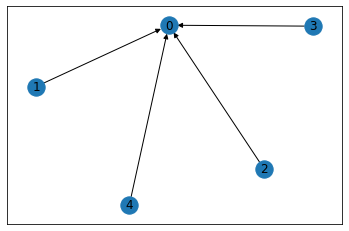

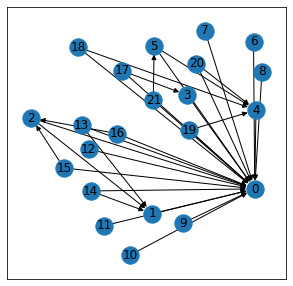

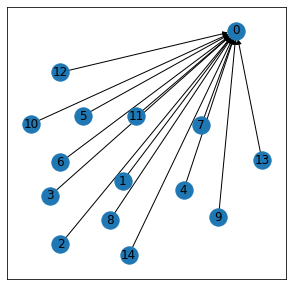

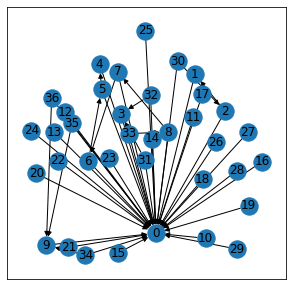

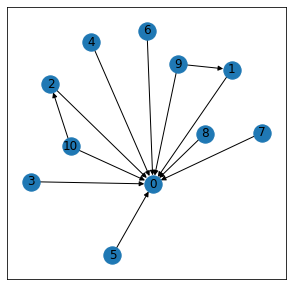

...

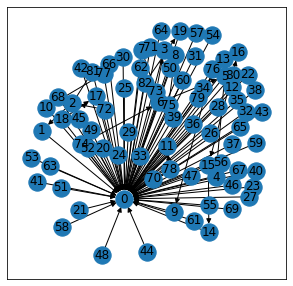

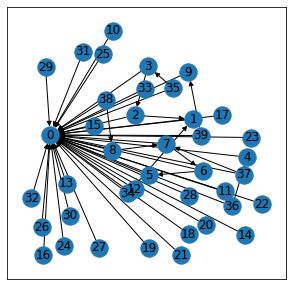

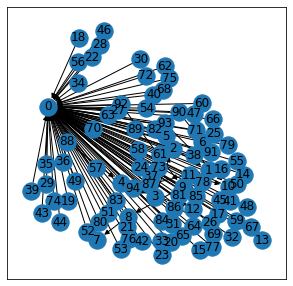

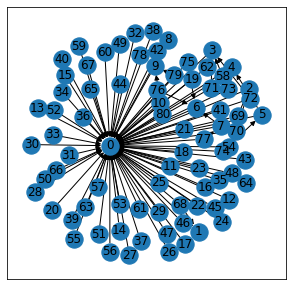

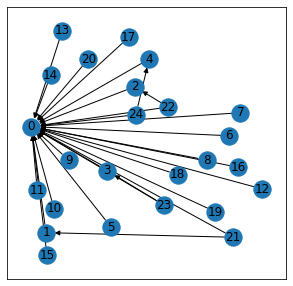

In [109]:
### DICTIO reading, EDGES extraction, call graph for depiction
source_list=[]
target_list=[]
for i in range(len(dictio)):
    sol=dictio[i]['edges'][0]
    tol=dictio[i]['edges'][1]
    graph(sol,tol)

In [110]:
import dgl
import torch
from dgl.data.utils import save_graphs
from torch.utils.data import Dataset, DataLoader

In [111]:
listtest=[498293668655423488, 498486826269548545, 500280249629036544, 500298588992593920, 524923293711998976, 524936793633083394, 524941720249978880,524948206023880704,524961721744900097,
         544274544174071809, 544294893146091520, 544315472075042818, 552788945017516032, 553480082996879360, 553553288625672192,
         553561170637238272, 580352273001410560, 581153923987206146, 581290271997968384, 581359544682614784, 758159624122097664,
         763098277986209792, 764927075522260992, 767725956706414592, 768859780240773121, 769988636754505729, 774991078265094144, 775057555865206784]

In [112]:
len(listtest)

28

In [113]:
listdev=[580319078155468800, 580332109782466561, 580325090367315968, 580339547269144576, 581386094337474560, 
        581473088249958400, 580340476949086208, 580360165540642816, 580321156508577792, 580319184652890113, 
        580348081100734464, 580322453928431617, 580333763512705025, 580333909008871424, 581293286268129280, 
        581047170637381632, 580331561398108160, 580326222107951104, 580882341880446977, 580324027715063808,
        581063377226637312, 580320684305416192, 580339825649291264, 580371845997682688, 580323060533764097]

In [114]:
def collate(samples):
    # The input `samples` is a list of pairs
    #  (graph, label).
    graphs, labels = map(list, zip(*samples))
    batched_graph = dgl.batch(graphs)
    return batched_graph, torch.tensor(labels)

In [116]:
graphs=[]
for i in range(272):
    
    if dictio[i]['tweet_id'][0] not in listtest:
        sol=dictio[i]['edges'][0]
        tol=dictio[i]['edges'][1]
        embtensor = torch.Tensor(dictio[i]['embeddings'])
        snctensor = torch.Tensor(dictio[i]['stance'])
        snctensor = snctensor.type(torch.int64) # transform tensor items into integers
        #print(snctensor)
        g = dgl.graph((tol, sol)) 
        g.ndata['x']=embtensor
        g.ndata['y']=snctensor
        graphs.append(g)
        #print(g)
save_graphs("./datatrain.bin", graphs)
train_dataloader = DataLoader(graphs, batch_size=100, shuffle=True, collate_fn=collate)

C:\Users\pmona\AppData\Local\Temp/ipykernel_15392/3696908543.py:7: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:264.)
  embtensor = torch.Tensor(dictio[i]['embeddings'])


In [117]:
graphs=[]
for i in range(273, 298):
    if dictio[i]['tweet_id'][0] in listtest:
        sol=dictio[i]['edges'][0]
        tol=dictio[i]['edges'][1]
        embtensor = torch.Tensor(dictio[i]['embeddings'])
        
        snctensor = torch.Tensor(dictio[i]['stance'])
        snctensor = snctensor.type(torch.int64) # transform tensor items into integers
        g = dgl.graph((tol, sol)) 
        g.ndata['x']=embtensor
        g.ndata['y']=snctensor
        graphs.append(g)
        #print(g)
save_graphs("./dataval.bin", graphs)
val_dataloader = DataLoader(graphs, batch_size=100, shuffle=True, collate_fn=collate)


In [118]:
graphs=[]
for i in range(298, 325):
    if dictio[i]['tweet_id'][0] in listtest:
        sol=dictio[i]['edges'][0]
        tol=dictio[i]['edges'][1]
        embtensor = torch.Tensor(dictio[i]['embeddings'])
        
        snctensor = torch.Tensor(dictio[i]['stance'])
        snctensor = snctensor.type(torch.int64) # transform tensor items into integers
        g = dgl.graph((tol, sol)) 
        g.ndata['x']=embtensor
        g.ndata['y']=snctensor
        graphs.append(g)
        #print(g)
save_graphs("./datatest.bin", graphs)
test_dataloader = DataLoader(graphs, batch_size=100, shuffle=True, collate_fn=collate)

In [119]:
from dgl.data.utils import load_graphs
train_data = load_graphs("./datatrain.bin")
val_data = load_graphs("./dataval.bin")
test_data = load_graphs("./datatest.bin")
#data = load_graphs("./data.bin")

In [120]:
print(train_data[0][271])

Graph(num_nodes=6, num_edges=5,
      ndata_schemes={'x': Scheme(shape=(32,), dtype=torch.float32), 'y': Scheme(shape=(), dtype=torch.int64)}
      edata_schemes={})


In [121]:
#https://docs.dgl.ai/en/0.2.x/tutorials/basics/4_batch.html
import dgl
import numpy as np
import urllib
import pandas as pd

from dgl.data import DGLDataset
from dgl.data.utils import load_graphs

import torch

def collate(samples):
    # The input `samples` is a list of pairs
    #  (graph, label).
    graphs, labels = map(list, zip(*samples))
    batched_graph = dgl.batch(graphs)
    return batched_graph, torch.tensor(labels)

In [122]:
class StanceDataset(DGLDataset):
    def __init__(self, data):
        self.data = data
        super().__init__(name='stance')

    def process(self):
        self.graphs = []
        self.labels = []
        self.labels2 = []
        # For each graph ID...
        for i in range(len(self.data[0])):
            self.graphs.append(self.data[0][i])
            self.labels.append(torch.tensor(1))
        # Convert the label list to tensor for saving.
        self.labels = torch.LongTensor(self.labels)
        #print(self.labels)
        #print(type(self.labels))
        print(self.labels2)

    def __getitem__(self, i):
        return self.graphs[i], self.labels[i]

    def __len__(self):
        return len(self.graphs)

In [124]:
test_dataset = StanceDataset(test_data)
train_dataset = StanceDataset(train_data)
val_dataset = StanceDataset(val_data)

[]
[]
[]


In [127]:
test_dataloader = DataLoader(test_dataset, batch_size=128, shuffle=False, collate_fn=collate)
train_dataloader = DataLoader(train_dataset, batch_size=128, shuffle=False, collate_fn=collate)
val_dataloader = DataLoader(val_dataset, batch_size=128, shuffle=False, collate_fn=collate)

In [128]:
from torch.utils.data import Dataset, DataLoader

In [129]:
next(iter(train_dataloader))

(Graph(num_nodes=2247, num_edges=3038,
       ndata_schemes={'x': Scheme(shape=(32,), dtype=torch.float32), 'y': Scheme(shape=(), dtype=torch.int64)}
       edata_schemes={}),
 tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1]))

In [130]:
## G C N     M O D E L 

class GCN(nn.Module):
    def __init__(self, in_feats, h_feats, num_classes):
        super(GCN, self).__init__()
        self.conv1 = GraphConv(in_feats, h_feats)
        self.conv2 = GraphConv(h_feats, h_feats)
        self.conv3 = GraphConv(h_feats, h_feats)
        self.conv4 = GraphConv(h_feats, h_feats)
        self.conv5 = GraphConv(h_feats, num_classes)

    def forward(self, g, in_feat):
        h = self.conv1(g, in_feat)
        h = F.relu(h)
        h = self.conv2(g, h)
        h = F.relu(h)
        h = self.conv3(g, h)
        h = F.relu(h)
        h = self.conv4(g, h)
        h = F.relu(h)
        h = self.conv5(g, h)
        return h

In [131]:
import torch.nn.functional as F
from lightning.pytorch.callbacks.early_stopping import EarlyStopping



model = GCN(32, 128, 4)#dataset.num_classes)\
criterion = torch.nn.CrossEntropyLoss()
opt = torch.optim.Adam(model.parameters())

 ############################
eval_loss= 0
best_eval_loss = 100000
trigger_times = 0
epoch_losses = []
eval_losses = []
for i in range(500):
    epoch_loss = 0
    find = False
    model.train()
    for d, l in train_dataloader:
        d = dgl.add_self_loop(d)
        features = d.ndata['x']
        #print(features)
        labels = d.ndata['y']
        #print(labels)
        logits = model(d,features)        
        pred = logits.argmax(1)   ######################compute predictions
        
        loss = F.cross_entropy(logits,labels)
        epoch_loss += loss.detach().item()
        
        train_acc = (pred == labels).float().mean()########################3
        opt.zero_grad()
        loss.backward()
        opt.step()
        
        
    print('Epoch {}, loss {:.4f}'.format(i, epoch_loss))
    epoch_losses.append(epoch_loss) 
    
    eval_loss = 0
    model.eval()
    
    
    ############## VALIDATION ######################
    for d, l in val_dataloader:
        with torch.no_grad():  
            d = dgl.add_self_loop(d)
            features = d.ndata['x']
            labels = d.ndata['y']
            logits = model(d,features)
            pred = logits.argmax(1)   ######################compute predictions
            loss = F.cross_entropy(logits,labels)   
            eval_loss += loss.detach().item()
            
       
    
    for d, l in test_dataloader:
        with torch.no_grad():
            d = dgl.add_self_loop(d)
            features = d.ndata['x']
            labels = d.ndata['y']
            logits = model(d,features)
            pred = logits.argmax(1)   ######################compute predictions
            loss = F.cross_entropy(logits,labels)   
            eval_loss += loss.detach().item()
        
            train_acc = (pred == labels).float().mean()########################3
            print('Epoch {}, validation loss {:.4f}'.format(i, eval_loss))
            print()
            eval_losses.append(eval_loss)


        
        if eval_loss > best_eval_loss:
            trigger_times += 1
            print('Trigger Times:', trigger_times)
#         else:
#             print('trigger times: 0')
#             trigger_times = 0
            
            if trigger_times >= 50:
                print('Early stopping!\n')
                find = True
        else:
            trigger_times = 0



        if eval_loss < best_eval_loss:
            print('Yesssssssssssssssssssssssssssssssssssssssssss')
            best_eval_loss = eval_loss
            path = "savedmodel.pth"
            torch.save(model.state_dict(), path)

    if find:
        break


C:\Users\pmona\anaconda3\lib\site-packages\dgl\backend\pytorch\tensor.py:445: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  assert input.numel() == input.storage().size(), (


Epoch 0, loss 4.1279
Epoch 0, validation loss 2.7042

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 1, loss 3.9972
Epoch 1, validation loss 2.6380

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 2, loss 3.8466
Epoch 2, validation loss 2.5599

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 3, loss 3.6565
Epoch 3, validation loss 2.4800

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 4, loss 3.4470
Epoch 4, validation loss 2.4270

Yesssssssssssssssssssssssssssssssssssssssssss
Epoch 5, loss 3.2568
Epoch 5, validation loss 2.4401

Trigger Times: 1
Epoch 6, loss 3.1296
Epoch 6, validation loss 2.5278

Trigger Times: 2
Epoch 7, loss 3.0801
Epoch 7, validation loss 2.6314

Trigger Times: 3
Epoch 8, loss 3.0463
Epoch 8, validation loss 2.6772

Trigger Times: 4
Epoch 9, loss 3.0075
Epoch 9, validation loss 2.6388

Trigger Times: 5
Epoch 10, loss 2.9525
Epoch 10, validation loss 2.5776

Trigger Times: 6
Epoch 11, loss 2.9032
Epoch 11, validation loss 2.5270

Trigger Times: 7

In [132]:
#check for all batches
model.load_state_dict(torch.load("savedmodel.pth"))
model.eval()
with torch.no_grad():
    for d, l in test_dataloader:

        d = dgl.add_self_loop(d)
        features = d.ndata['x']        
        labels = d.ndata['y']
        logits = model(d,features)
        y_pred = logits.argmax(1)  
        print(y_pred)
        print(labels)
        acc = (y_pred == labels).float().mean()
        print(acc)
        acc = (y_pred.round() == labels).float().mean()
        acc = float(acc)
        print("Model accuracy: %.2f%%" % (acc*100))


tensor([1, 1, 1,  ..., 1, 1, 1])
tensor([3, 2, 1,  ..., 1, 1, 1])
tensor(0.6111)
Model accuracy: 61.11%


In [133]:
from sklearn.metrics import f1_score
f1_score(labels, y_pred, average='macro')

0.28128955505958053

In [134]:
import tensorflow as tf
confusion_matrix = tf.math.confusion_matrix(labels, y_pred)

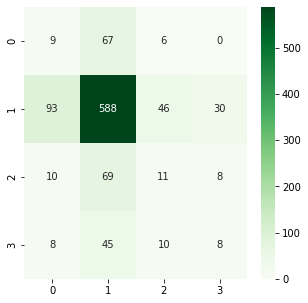

In [135]:
import seaborn as sb
fig = sb.heatmap(confusion_matrix, annot=True, fmt='g', cmap='Greens')

### 0 SUPPORT, 1 COMMENT, 2 QUERY, 3 DENY


In [136]:
############################################################################
############################################################################
############################################################################
############################################################################